<a href="https://colab.research.google.com/github/nguyenbac5299/DataScience/blob/main/Dog_Breed_Indentify.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Get data realy

## Accessing data

In [3]:
path_file='/content/drive/MyDrive/DataScience/data/dog-breed-identification.zip'
!unzip '/content/drive/MyDrive/DataScience/data/dog-breed-identification.zip' -d '/content/'

Streaming output truncated to the last 5000 lines.
  inflating: /content/train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: /content/train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: /content/train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: /content/train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: /content/train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: /content/train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: /content/train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: /content/train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg  
  inflating: /content/train/83fad0718581a696132c96c166472627.jpg  
  inflating: /content/train/83fbbcc9a612e3f712b1ba199da61f20.jpg  
  inflating: /content/train/8403d8936430c2f05ab7d74d23c2c0cb.jpg  
  inflating: /content/train/8406d837b2d7fac1c3cd621abb4c4f9e.jpg  
  inflating: /content/train/840b67d26e5e43f8eb6430f62d4ba1ac.jpg  
  inflating: /content/train/840db91ba4600148f3dcb06ec419b421.jpg  
  inflating

In [4]:
# import Tensorflow into Colab
import tensorflow as tf

print('TF version:', tf.__version__)

TF version: 2.9.2


In [5]:
from tensorflow.python.framework.config import list_physical_devices
import tensorflow_hub as hub
print('Run in GPU' if tf.config.list_physical_devices('GPU') else 'None' )

Run in GPU


## Getting images and their labels

In [6]:
import pandas as pd
label_csv= pd.read_csv('/content/labels.csv')
label_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [7]:
label_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


In [8]:
# how many image are there of breed?
label_csv['breed'].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

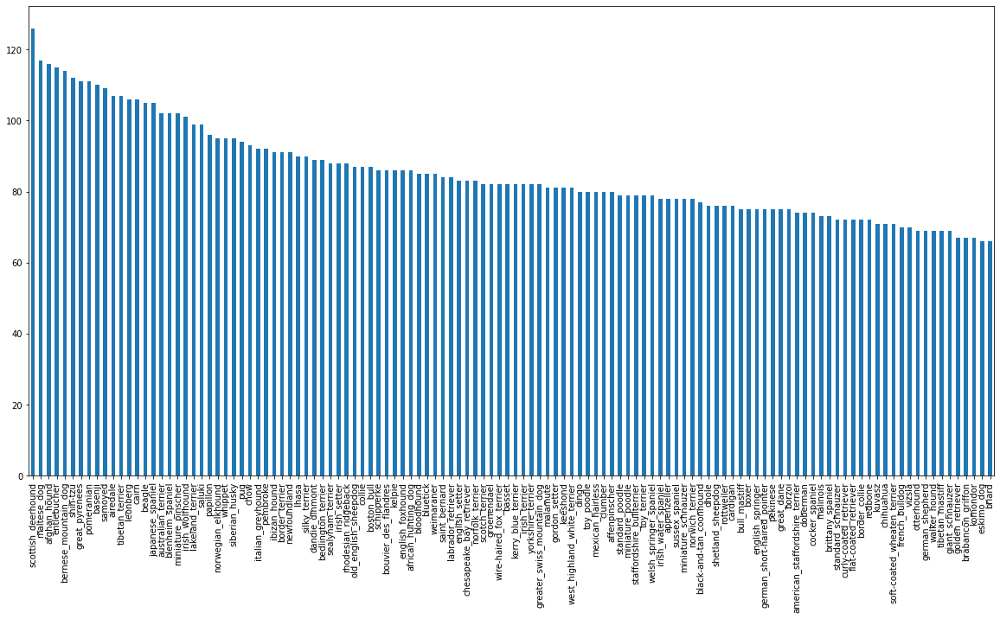

In [9]:
label_csv['breed'].value_counts().plot.bar(figsize=(20,10))

In [10]:
label_csv['breed'].value_counts().median()

82.0

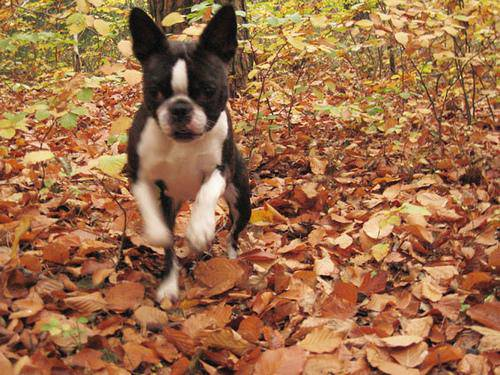

In [11]:
# Let view an image
from IPython.display import Image

Image('/content/train/000bec180eb18c7604dcecc8fe0dba07.jpg')

In [12]:
# create pathnames from image id

filenames=[fname for fname in label_csv['id']]
filenames[:10]

['000bec180eb18c7604dcecc8fe0dba07',
 '001513dfcb2ffafc82cccf4d8bbaba97',
 '001cdf01b096e06d78e9e5112d419397',
 '00214f311d5d2247d5dfe4fe24b2303d',
 '0021f9ceb3235effd7fcde7f7538ed62',
 '002211c81b498ef88e1b40b9abf84e1d',
 '00290d3e1fdd27226ba27a8ce248ce85',
 '002a283a315af96eaea0e28e7163b21b',
 '003df8b8a8b05244b1d920bb6cf451f9',
 '0042188c895a2f14ef64a918ed9c7b64']

In [13]:
filenames=['/content/train/'+ fname +'.jpg' for fname in label_csv['id']]
filenames[:5]

['/content/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/train/0021f9ceb3235effd7fcde7f7538ed62.jpg']

In [14]:
# Check whether number of filenames matchs number of actual image file
import os

if(len(os.listdir('/content/train/'))== len(filenames)):
  print('Macth')
else:
  print('Not match')

Macth


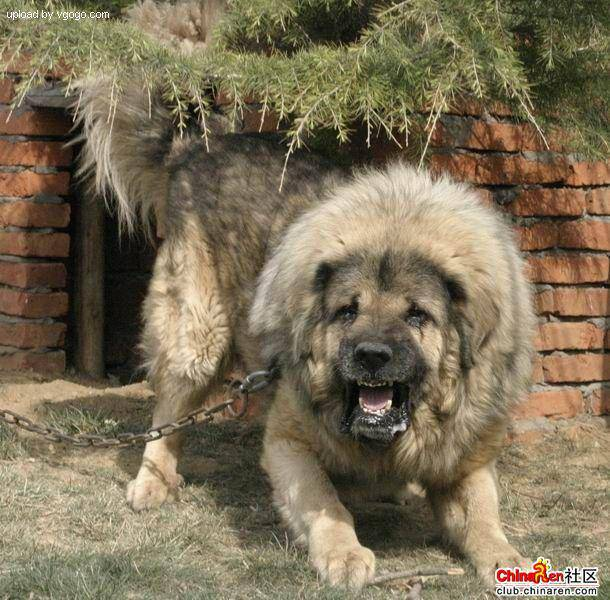

In [15]:
Image(filenames[9000])

In [16]:
label_csv['breed'][9000]

'tibetan_mastiff'

Since we've now got our training image filepaths in a list, let's prepare our label

In [17]:
labels= label_csv['breed']

In [18]:
import numpy as np

labels= np.array(labels)
# recomand: labels= labels_csv['breed].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [19]:
len(labels)

10222

In [20]:
# check number of label matches the number of filenames

if len(labels)==len(filenames):
  print('match')
else:
  print('Not match')

match


In [21]:
# Find the unique label values
unique_breeds= np.unique(labels)
len(unique_breeds)

120

In [22]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [23]:
# Turn every label into a boolean array
boolean_labels=[label==unique_breeds for label in labels]
len(boolean_labels)

10222

In [24]:
boolean_labels[10]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
        True, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [25]:
# Exempale turnning boolean array into integers
print(labels[0])
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [26]:
print(np.where(unique_breeds==labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array

(array([19]),)
19


## Creating our own valiation set

In [27]:
from pandas.core.arrays import boolean
# Setup X&y variables
X= filenames
y= boolean_labels

len(filenames), len(boolean_labels)

(10222, 10222)

We're going to start off experimenting with 1000 images and increase as needed

In [28]:
# Set number of images to use for experimenting
NUM_IMAGES= 1000 #@param {type:"slider", min:1000, max:10000}

# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val= train_test_split(X[:NUM_IMAGES],
                                                 y[:NUM_IMAGES],
                                                 test_size=0.2,
                                                 random_state=42)
len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

## Processing image (turning images into tensors)
1. Take an image filepath as input
2. Use Tensorflow to read the file and save it to a variable 'image'
3. Turn our image into tensor
4. Normalize our image (convert channel values from 0-255 to 0-1)
4. Resize image to be a shape of (224, 224)
5. return the modified image

In [29]:
# Convert image to Numpy array
from matplotlib.pyplot import imread
image= imread(filenames[42])
image.shape


(257, 350, 3)

In [30]:
image.max(), image.min()

(255, 0)

In [31]:
#turn image to tensor
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  5

In [32]:
# make function to preprocess them
# Inorder to use TensorFlow effectivly. we need our data in form of Tensor tuple (look like (image, label))

# Define image size
IMG_SIZE=224

# Create a function to preprocessing images
def preprocess_image(image_path, image_size= IMG_SIZE):
  """
  Take a image path and return a tensor
  """
  # read in an image file
  image= tf.io.read_file(image_path)
  # Turn the jpg image to numerical tensor with 3 channel
  image = tf.image.decode_jpeg(image, channels=3)
  # convert the colour channel values from 0-255 to 0-1
  image= tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224,224)
  image= tf.image.resize(image,[image_size, image_size])

  return image



## Visualizing data batches

In [33]:
# Create a simple function to return a tuple(image, label)
def get_image_label (image_path, label):
  image= preprocess_image(image_path)
  return image, label

In [34]:
# Turn our data into tuple of Tensors. let's make function to turn all of our data (X & y)
BATCH_SIZE= 32

# Create function to turn data into batches
def create_data_batches(X, y=None, batch_size= BATCH_SIZE, valid_data= False, test_data= False):
  # If the data is test dataset, we probably don't have labels
  if test_data:
    print('Create test data batches')
    data= tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(preprocess_image).batch(batch_size)
    return data_batch

  elif valid_data:
    print('Create validation data batches')
    data= tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                              tf.constant(y)))
    data_batch= data.map(get_image_label).batch(batch_size)
    return data_batch
  else:
    print('Create train data batches')
    data= tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                              tf.constant(y)))
    data= data.shuffle(buffer_size=len(X))
    data_batch= data.map(get_image_label).batch(batch_size)
  return data_batch

In [35]:
# Create training and calidation data batches
train_data= create_data_batches(X_train, y_train)
val_data= create_data_batches(X_val, y_val, valid_data=True)

Create train data batches
Create validation data batches


In [36]:
# Check out the different attributes of our data batches
train_data.element_spec

(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))

In [37]:
import matplotlib.pyplot as plt

#Create a function for viewing image in a data batch
def show_5_images(images, labels):
  # Setup figure
  plt.figure(figsize=(20,10))

  # Loop throught 5 (for display 5 images)
  for i in range(5):
    # Create subplots (1 rows, 5 columns)
    ax= plt.subplot(1,5,i+1)
    # display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])

In [38]:
train_images, train_label= next(train_data.as_numpy_iterator())
train_images[0]

array([[[0.25410587, 0.2894    , 0.2776353 ],
        [0.29784313, 0.33313724, 0.32137254],
        [0.29804096, 0.33333507, 0.32157037],
        ...,
        [0.41461015, 0.46559054, 0.38715917],
        [0.44833592, 0.4993163 , 0.42088494],
        [0.44921985, 0.5002003 , 0.42176887]],

       [[0.27608263, 0.31137675, 0.29961205],
        [0.30547515, 0.34076926, 0.32900456],
        [0.28803927, 0.32333338, 0.31156868],
        ...,
        [0.41783684, 0.46881723, 0.39038587],
        [0.46009547, 0.51107585, 0.4326445 ],
        [0.48616162, 0.537142  , 0.45871064]],

       [[0.29875293, 0.33404705, 0.3144392 ],
        [0.27189255, 0.30718666, 0.28757882],
        [0.28608775, 0.32138187, 0.30177402],
        ...,
        [0.47503573, 0.5260161 , 0.44758475],
        [0.49345425, 0.54443467, 0.46600327],
        [0.4703167 , 0.5212971 , 0.44286573]],

       ...,

       [[0.77551085, 0.7260472 , 0.59820485],
        [0.8635614 , 0.8325143 , 0.6913045 ],
        [0.7919249 , 0

In [39]:
len(train_images)

32

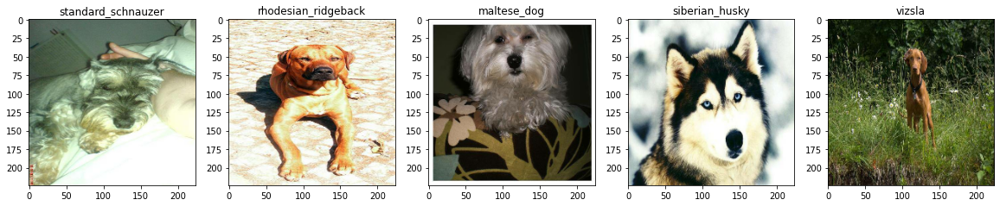

In [40]:
# Visualize data 
show_5_images(train_images, train_label)

# Creating and training model

Befor we build a model, there are a few things we need to define:

* The input shape
* Output shape
* The URL of the model we want to use from tensorflow hub

## Bulding a model

In [41]:
# Setup input shape to the model
INPUT_SHAPE=[None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, color channels

#Setup output shape 
OUTPUT_SHAPE= len(unique_breeds)

# Setup model URL from Tensorhub
MODEL_URL= "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

## Seting up the model layers

In [42]:
from tensorflow._api.v2.config import optimizer
""" Create function:
1. Take the input shape, output shape and the model
2. Define the the layers in a Keras model in sequential
3. Compiles the model
4. Build model 
5. Return model"""

# Create a function which builds a model
def create_model(input_shape= INPUT_SHAPE, output_shape= OUTPUT_SHAPE, model_url= MODEL_URL):
  # Setup the model
  model= tf.keras.Sequential([
      hub.KerasLayer(model_url), #Layer 1 (input layer)
      tf.keras.layers.Dense(units= output_shape,
                            activation='softmax') # layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss= tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=['accuracy']
  )

  #Build the model
  model.build(input_shape)
  return model


In [43]:
model= create_model()
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callback

### TensorBoard Callback

In [44]:
# Load TensorBoard notebook extension
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [45]:
import datetime

# Create a function to build a TensorBoard
def create_tensorflowboard_callback():
  # Create a log dir for storing tensorflowboard logs:
  logdir= os.path.join('/content/drive/MyDrive/DataScience/logs',
                       datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping callback
Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving

In [47]:
early_stopping= tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                 patience=3)


## Training a model on the subset of data

In [46]:
NUM_EPOCHS=100 #@param {type:'slider', min:10, max:100}

In [49]:
# check to make sure we're still running on GPU
print('GPU' if tf.config.list_physical_devices('GPU') else 'None')

GPU


In [50]:
# Create function to trains a model
def train_model():
  # Create model
  model= create_model()
  #Create new TensorBoard session everytime we train a model
  tensorboard= create_tensorflowboard_callback()
  #Fit the model
  model.fit(x= train_data,
            epochs=NUM_EPOCHS,
            validation_data= val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  return model

In [51]:
#Fit the model to the data
model= train_model()

Epoch 1/100
25/25 [==============================] - 14s 138ms/step - loss: 4.6968 - accuracy: 0.0875 - val_loss: 3.5920 - val_accuracy: 0.2200
Epoch 2/100
25/25 [==============================] - 2s 88ms/step - loss: 1.6910 - accuracy: 0.6925 - val_loss: 2.2666 - val_accuracy: 0.5050
Epoch 3/100
25/25 [==============================] - 4s 144ms/step - loss: 0.5875 - accuracy: 0.9375 - val_loss: 1.6750 - val_accuracy: 0.6050
Epoch 4/100
25/25 [==============================] - 2s 89ms/step - loss: 0.2594 - accuracy: 0.9887 - val_loss: 1.5048 - val_accuracy: 0.6650
Epoch 5/100
25/25 [==============================] - 2s 89ms/step - loss: 0.1502 - accuracy: 0.9962 - val_loss: 1.4334 - val_accuracy: 0.6650
Epoch 6/100
25/25 [==============================] - 2s 84ms/step - loss: 0.1019 - accuracy: 1.0000 - val_loss: 1.3829 - val_accuracy: 0.6700
Epoch 7/100
25/25 [==============================] - 2s 88ms/step - loss: 0.0763 - accuracy: 1.0000 - val_loss: 1.3440 - val_accuracy: 0.6850
Epo

### Checking the TensorBoard log

In [52]:
%tensorboard --logdir /content/drive/MyDrive/DataScience/logs


<IPython.core.display.Javascript object>

##Making and evaluating predictions using trained model

In [53]:
# Make prediction on the validation data
predictions= model.predict(val_data,verbose=1)

7/7 [==============================] - 3s 119ms/step


In [54]:
predictions

array([[2.2030393e-04, 5.3094263e-05, 1.0639678e-03, ..., 1.9798247e-04,
        6.9831236e-05, 3.9148564e-03],
       [3.9637573e-03, 2.6769605e-03, 4.5168390e-03, ..., 2.0024732e-04,
        3.3889010e-03, 6.3788641e-05],
       [4.1639581e-05, 1.1572199e-04, 5.0026028e-06, ..., 7.1664683e-05,
        4.3395112e-04, 1.3637308e-04],
       ...,
       [1.2355179e-06, 4.2735715e-05, 3.1578427e-04, ..., 3.7158832e-05,
        1.5493986e-04, 9.5441203e-05],
       [5.8891263e-04, 4.5263546e-04, 3.0117494e-04, ..., 1.0776487e-04,
        3.4134573e-05, 1.1180688e-02],
       [1.1610206e-03, 2.1437216e-05, 1.5100915e-03, ..., 1.6482264e-02,
        8.8829506e-04, 2.6313175e-04]], dtype=float32)

In [56]:
unique_breeds[np.argmax(predictions[0])]

'border_terrier'

In [57]:
# Turn prediction probabilities into their respective label
def get_pred_label(predictions_probabilities):
  return unique_breeds[np.argmax(predictions_probabilities)]

# Get a predicted label
pred_label= get_pred_label(predictions[10])
pred_label

'yorkshire_terrier'

In [59]:
images_=[]
labels_=[]

for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)


In [60]:
get_pred_label(predictions[0])

'border_terrier'

In [61]:
get_pred_label(labels_[0])

'cairn'

In [64]:
# Create function to unbatch val_data
def unbatchify(data):
  images=[]
  labels=[]
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(label)

  return images,labels

val_images, val_labels= unbatchify(val_data)

In [65]:
get_pred_label(val_labels[0])

'cairn'

In [73]:
def plot_pred(predictions_probabilities, labels, images,n=1):
  pred_prob, true_label, image= predictions_probabilities[n], labels[n], images[n]

  #get the pred label and true label
  pred_label= get_pred_label(pred_prob)
  true_label= get_pred_label(true_label)

  #Plot image and remove tick
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  # Change the colour of the title
  if true_label==pred_label:
    color='green'
  else:
    color='red'
  # Change plot title
  plt.title('{} {:2.0f}% {}'.format(pred_label,
                                   np.max(pred_prob)*100,
                                   true_label),
            color=color)

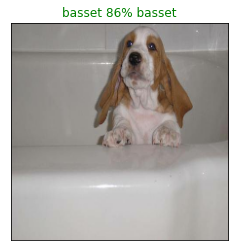

In [74]:
plot_pred(predictions, val_labels, val_images, n=2)  

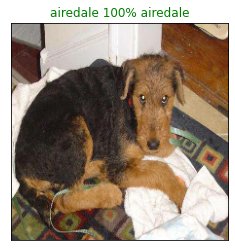

In [75]:
plot_pred(predictions, val_labels, val_images, n=4)  

In [89]:
# Create function to plot the top 1- prediction probability values and labels
def plot_pred_conf(prediction_probabilities, labels, n=1):

  pred_prob, true_label= prediction_probabilities[n], labels[n]

  pred_label= get_pred_label(pred_prob)
  true_label= get_pred_label(true_label)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes= pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values= pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction label
  top_10_pred_labels= unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot= plt.bar(np.arange(len(top_10_pred_labels)),
                    top_10_pred_values,
                    color='grey')
  
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels= top_10_pred_labels,
             rotation='vertical')
  
  
  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels==true_label)].set_color('green')
  else:
    pass

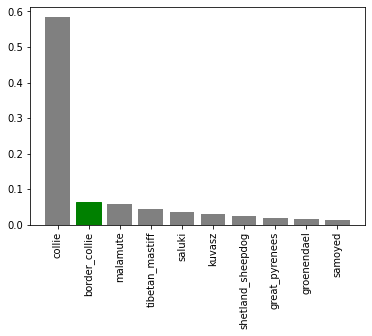

In [90]:
plot_pred_conf(predictions, val_labels, n=9)

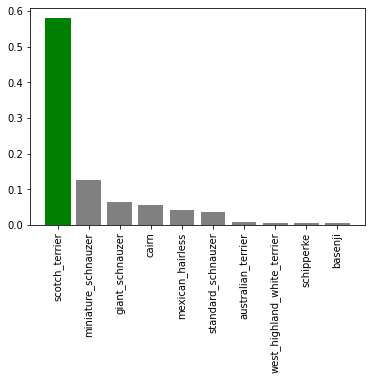

In [91]:
plot_pred_conf(predictions, val_labels, n=1)

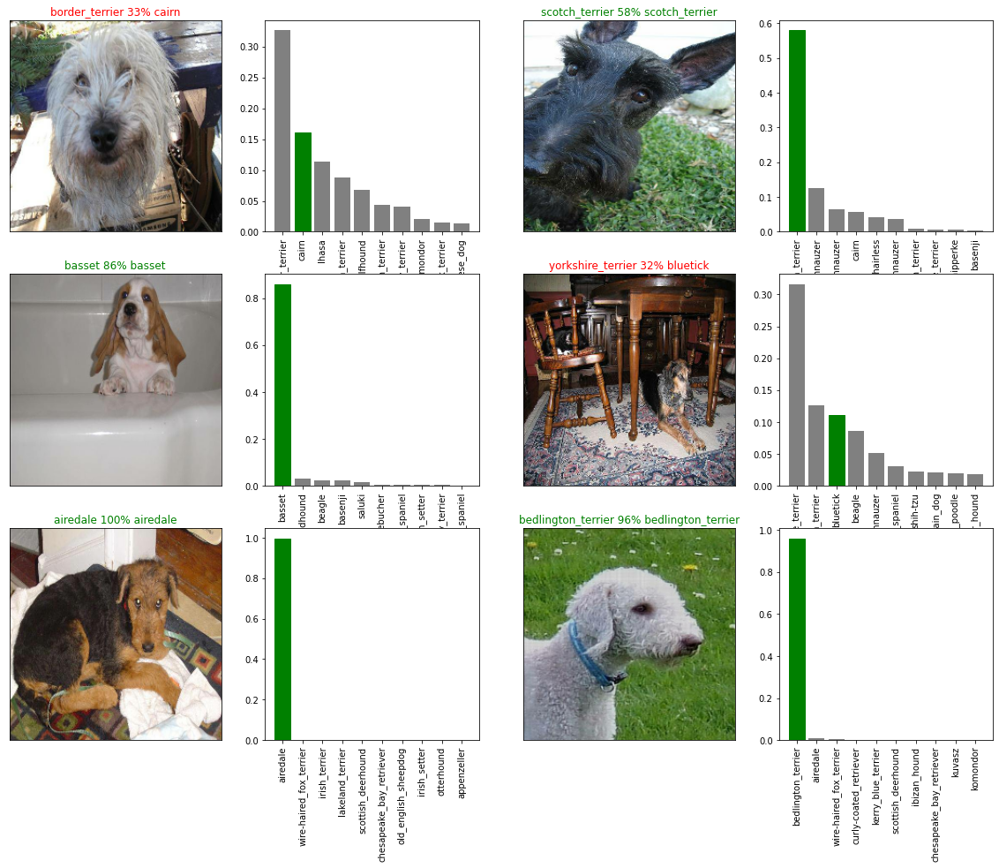

In [92]:
i_multiplier=0
num_rows=3
num_cols=2
num_images= num_rows* num_cols

plt.figure(figsize=(10* num_cols, 5 * num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i +1)
  plot_pred(predictions, val_labels,val_images, n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i +2)
  plot_pred_conf(predictions,val_labels, i+i_multiplier)

plt.show()

##Saving and reloading a model

In [93]:
# Create a function to save a model
def save_model(model, suffix=None):
  # Create a model directory pathname with current time
  model_dir= os.path.join('/content/drive/MyDrive/DataScience/model',
                          datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  model_path= model_dir +'-'+ suffix +'.h5'
  print(f'Save model to: {model_path}')
  model.save(model_path)
  return model_path

In [95]:
# Create function to load trained model
def load_model(model_path):
  print(f'Loading saved model {model_path}')
  model= tf.keras.models.load_model(model_path,
                                    custom_objects={'KerasLayer':hub.KerasLayer})
  return model

In [96]:
save_model(model, suffix='1000-images-dog-breed-indentify')

Save model to: /content/drive/MyDrive/DataScience/model/20230208-095021-1000-images-dog-breed-indentify.h5


'/content/drive/MyDrive/DataScience/model/20230208-095021-1000-images-dog-breed-indentify.h5'

In [97]:
loaded_1000_images_model= load_model('/content/drive/MyDrive/DataScience/model/20230208-095021-1000-images-dog-breed-indentify.h5')

Loading saved model /content/drive/MyDrive/DataScience/model/20230208-095021-1000-images-dog-breed-indentify.h5


In [98]:
# Evaluate the pre_saved model

model.evaluate(val_data)

7/7 [==============================] - 1s 94ms/step - loss: 1.2504 - accuracy: 0.6950


[1.2504276037216187, 0.6949999928474426]

In [99]:
loaded_1000_images_model.evaluate(val_data)

7/7 [==============================] - 2s 111ms/step - loss: 1.2504 - accuracy: 0.6950


[1.2504276037216187, 0.6949999928474426]

## Training a model (on the full data)

In [101]:
# Create a data batch with the full data
full_data= create_data_batches(X,y)
len(full_data)* 32

Create train data batches


10240

In [102]:
# Create a model for full model
full_model= create_model()

In [103]:
# Create full model callback
full_model_tensorboard= create_tensorflowboard_callback()
# no validation set when training on all data so we can't monitor validation accuracy
full_model_early_stopping= tf.keras.callbacks.EarlyStopping(monitor='accuracy',
                                                            patience=3)
#Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 28s 75ms/step - loss: 1.3424 - accuracy: 0.6743
Epoch 2/100
320/320 [==============================] - 24s 75ms/step - loss: 0.4090 - accuracy: 0.8801
Epoch 3/100
320/320 [==============================] - 24s 74ms/step - loss: 0.2372 - accuracy: 0.9339
Epoch 4/100
320/320 [==============================] - 22s 69ms/step - loss: 0.1541 - accuracy: 0.9629
Epoch 5/100
320/320 [==============================] - 24s 75ms/step - loss: 0.1063 - accuracy: 0.9767
Epoch 6/100
320/320 [==============================] - 24s 76ms/step - loss: 0.0758 - accuracy: 0.9858
Epoch 7/100
320/320 [==============================] - 35s 111ms/step - loss: 0.0579 - accuracy: 0.9921
Epoch 8/100
320/320 [==============================] - 22s 70ms/step - loss: 0.0449 - accuracy: 0.9945
Epoch 9/100
320/320 [==============================] - 24s 74ms/step - loss: 0.0393 - accuracy: 0.9953
Epoch 10/100
320/320 [==============================] - 24s 74ms/step - 

### Saving and reloading the full model

In [104]:
save_model(full_model, suffix='full_image_dog_breed_indentify')

Save model to: /content/drive/MyDrive/DataScience/model/20230208-101653-full_image_dog_breed_indentify.h5


'/content/drive/MyDrive/DataScience/model/20230208-101653-full_image_dog_breed_indentify.h5'

In [105]:
loaded_full_model= load_model('/content/drive/MyDrive/DataScience/model/20230208-101653-full_image_dog_breed_indentify.h5')

Loading saved model /content/drive/MyDrive/DataScience/model/20230208-101653-full_image_dog_breed_indentify.h5


### Making predicitons on the test dataset

In [107]:
# Load test image filenames
test_path='/content/test/'
test_filenames=[test_path+ fname for fname in os.listdir(test_path)]
test_filenames[:5]

['/content/test/b17ceba622d29a602e0457e497984ea1.jpg',
 '/content/test/d7678b731ca252aa2a49d5c3d4c6e6c0.jpg',
 '/content/test/5bd406fee0b55f66245b6ac9f278d28f.jpg',
 '/content/test/c33c553bbad1dd3c2b36a85b79a94f91.jpg',
 '/content/test/989ba099eeab77454a9b8829d1a89d45.jpg']

In [108]:
len(test_filenames)

10357

In [110]:
test_data= create_data_batches(test_filenames,test_data=True)

Create test data batches


In [111]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [112]:
# make prediction on test data using the loaded full model
test_predictions= loaded_full_model.predict(test_data,
                                            verbose=1)

324/324 [==============================] - 28s 83ms/step


In [115]:
test_predictions[:1]

array([[2.01360386e-08, 1.30944200e-09, 3.36044018e-12, 3.78795022e-08,
        1.06708444e-11, 5.34230050e-13, 3.47560061e-08, 1.08450271e-11,
        5.34442594e-11, 2.45729300e-13, 7.07667674e-11, 8.59831939e-09,
        4.18434981e-10, 1.25518049e-08, 2.00009098e-09, 4.82822810e-12,
        3.00678343e-10, 8.14632389e-11, 6.43935046e-13, 8.40531204e-12,
        9.90231570e-07, 1.03142477e-11, 6.59863542e-09, 6.50855422e-04,
        2.98143697e-11, 3.98611100e-08, 1.47322140e-07, 3.22048777e-11,
        9.16600389e-12, 2.49006490e-13, 1.74101666e-09, 3.01557357e-08,
        1.67863714e-08, 6.67258913e-12, 9.27283220e-15, 3.41467711e-07,
        1.36357993e-12, 1.29662806e-12, 9.60348988e-12, 3.97804278e-09,
        1.56145149e-11, 2.53159559e-12, 6.39065134e-10, 3.86092010e-13,
        5.59108478e-13, 2.38095321e-10, 6.35093714e-11, 8.31129328e-14,
        3.76748437e-13, 8.70942624e-11, 4.48048709e-10, 3.51762261e-12,
        1.59459147e-11, 1.30723529e-10, 3.00626386e-12, 9.472358

In [113]:
#Save predict (Numpy array) to csv file( for access later)
np.savetxt('/content/drive/MyDrive/DataScience/data/preds_array.csv', test_predictions, delimiter=',')

In [117]:
# Load predictions from csv file
test_predictions= np.loadtxt('/content/drive/MyDrive/DataScience/data/preds_array.csv', delimiter=',')

In [118]:
test_predictions.shape

(10357, 120)

### Preparing test dataset predictions for Kaggle

## Making predictions on custom images

In [119]:
custom_path='/content/drive/MyDrive/DataScience/data/dog_photos/'
custom_image_paths=[custom_path + fname for fname in os.listdir(custom_path)]
custom_image_paths

['/content/drive/MyDrive/DataScience/data/dog_photos/1.jpg',
 '/content/drive/MyDrive/DataScience/data/dog_photos/2.jpg',
 '/content/drive/MyDrive/DataScience/data/dog_photos/4.jpg',
 '/content/drive/MyDrive/DataScience/data/dog_photos/3.jpg']

In [121]:
# Turn custom images into batch dataset
custom_data= create_data_batches(custom_image_paths, test_data= True)
custom_data

Create test data batches


<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [124]:
custom_preds= loaded_full_model.predict(custom_data)
custom_preds.shape

1/1 [==============================] - 0s 60ms/step


(4, 120)

In [125]:
custom_pred_labels= [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['labrador_retriever', 'blenheim_spaniel', 'golden_retriever', 'pug']

In [126]:
custom_images=[]
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

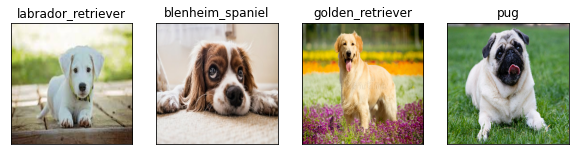

In [129]:
# Check custom image predictions
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1,4,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)